This exercise involves the Boston housing data set. For more info about the dataset visit:

https://www.cs.toronto.edu/~delve/data/boston/bostonDetail.html

*You may use as many code and text cells for your solution.*


### 1) Load the dataset

How many rows are in this data set? 

How many columns? 

What do the rows and columns represent?

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()


df_backup = pd.read_csv('csv_files/boston_house_prices.csv')
df =  pd.read_csv('csv_files/boston_house_prices.csv')
df
df.count()
df.shape
df

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0


The dataset includes the 14 different features (parameter)  of 506 suburbs in Boston city that could effect the household prices

### 2) Make some pairwise scatterplots of the predictors (columns) in this data set. Describe your findings.

Hint: Use Seaborn.pairplot()

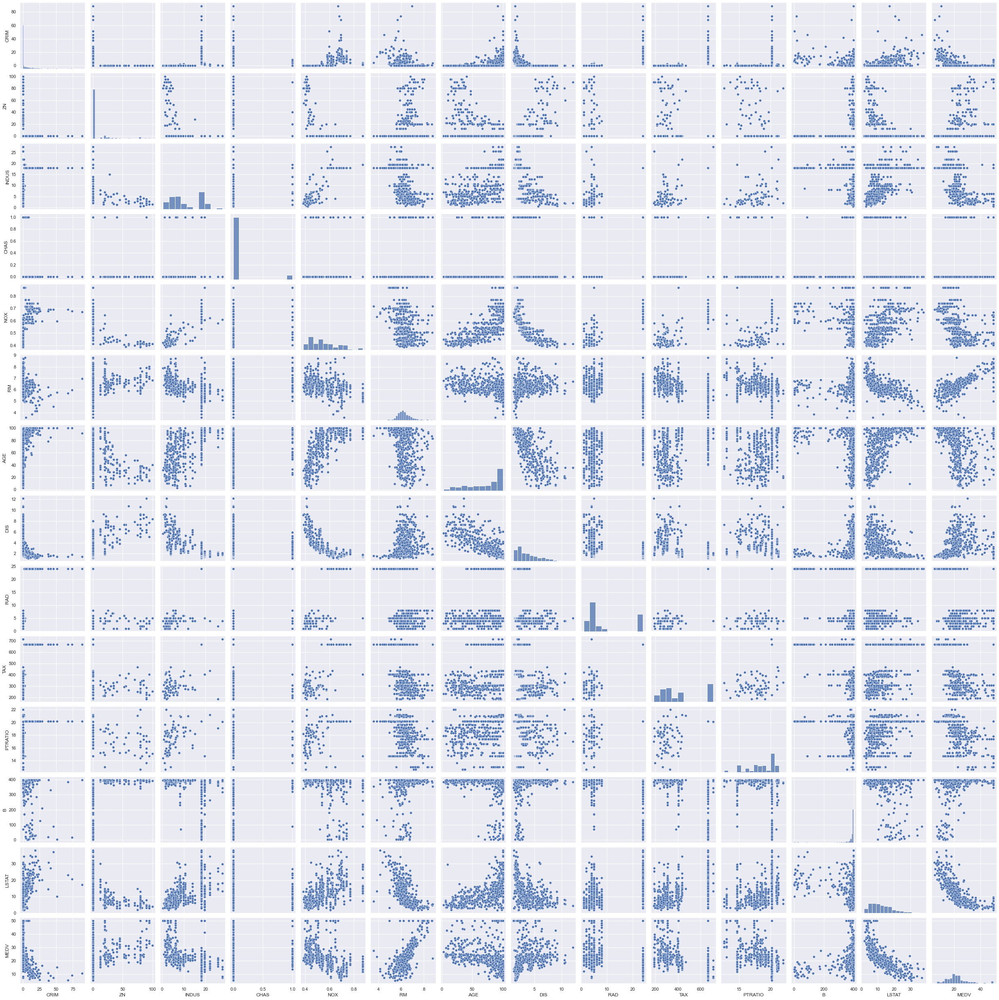

In [8]:
sns.pairplot(df)
plt.show()

It could be said that there are correlations between pairwises NOX-DIS, RM-LSTAT, RM-MEDV, LSTAT-MEDV.

NOX-DIS -> negative, not linear

RM-LSTAT -> negative, linear

RM-MEDV -> positive, linear

LSTAT-MEDV -> negative, not linear

### 3) Are any of the predictors associated with per capita crime rate? If so, explain the relationship.

Hint: Create separate scatter plots of CRIM on y axis, and other variables on x axis

*You may create as many code and text cells for your answer below*

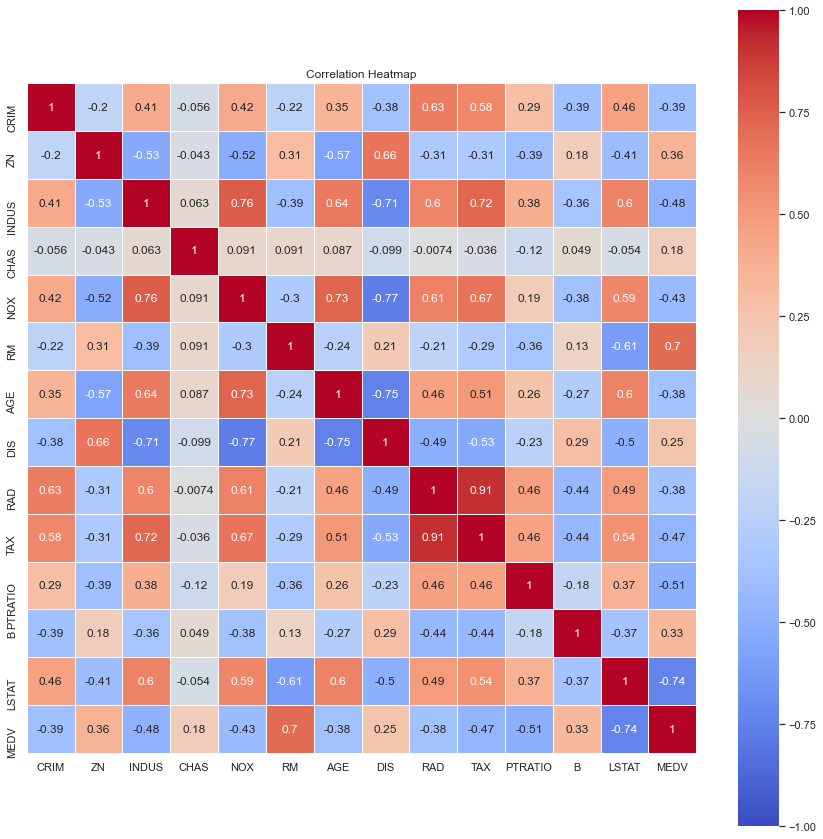

In [9]:
fig,ax = plt.subplots(figsize=(15,15))
sns.heatmap(df.corr(),annot=True, cmap= 'coolwarm', vmin=-1, vmax=1, center= 0,
            square=True, linewidths=1,ax = ax)
ax.set_title('Correlation Heatmap')
plt.show()

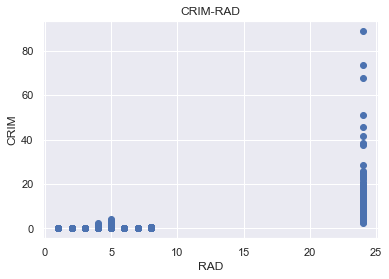

In [13]:

plt.scatter(df['RAD'],df['CRIM'])
plt.title('CRIM-RAD')
plt.xlabel('RAD')
plt.ylabel('CRIM')
plt.show()

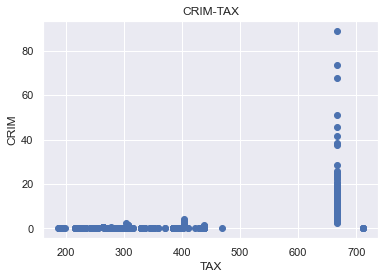

In [14]:
plt.scatter(df['TAX'],df['CRIM'])
plt.title('CRIM-TAX')
plt.xlabel('TAX')
plt.ylabel('CRIM')
plt.show()

The relation between CRIM-TAX and CRIM-RAD are similiar. after determined TAX or RAD value the CRIM rate increases.

### 4) Do any of the suburbs of Boston appear to have particularly high crime rates, how many possible outliers for crime rates? Tax rates? Pupil-teacher ratios? Comment on the range of each predictor.

Hint: You may create histograms for all of these variables. For CRIM, you may count the observations above 1.5*inter quantile range

*use as many code and text cells as you like*

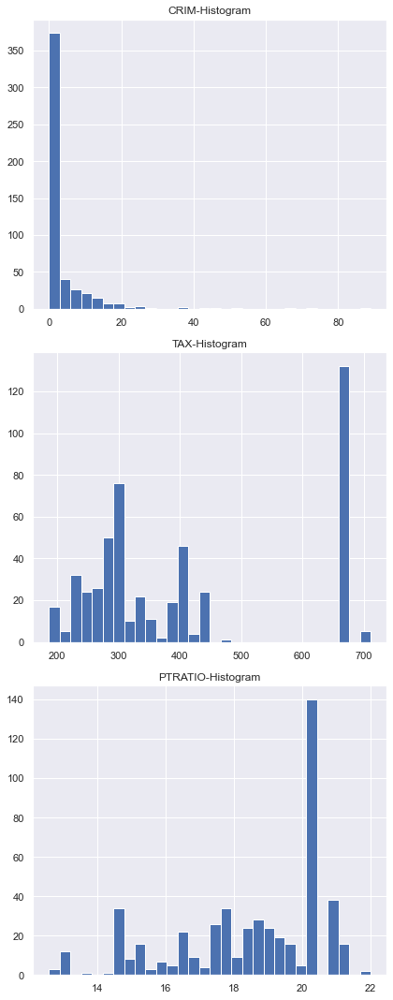

66
0
0


In [25]:
fig, axes = plt.subplots(nrows=3,ncols=1, figsize=(6,15))
axes[0].hist(df['CRIM'],bins=30)
axes[0].set_title("CRIM-Histogram")

axes[1].hist(df['TAX'],bins=30)
axes[1].set_title("TAX-Histogram")

axes[2].hist(df['PTRATIO'],bins=30)
axes[2].set_title("PTRATIO-Histogram")

plt.tight_layout()
plt.show()



q1_crim = df['CRIM'].quantile(0.25)
q3_crim = df['CRIM'].quantile(0.75)
iqr_crim = q3_crim - q1_crim
lower_bound_crim = q1_crim - (1.5*iqr_crim)
upper_bound_crim = q3_crim + (1.5*iqr_crim)
print(len(df[df['CRIM']>upper_bound_crim]))

q1_tax = df['TAX'].quantile(0.25)
q3_tax = df['TAX'].quantile(0.75)
iqr_tax = q3_tax - q1_tax
lower_bound_tax = q1_tax - (1.5*iqr_tax)
upper_bound_tax = q3_tax + (1.5*iqr_tax)
print(len(df[df['TAX']>upper_bound_tax]))

q1_ptratio = df['PTRATIO'].quantile(0.25)
q3_ptratio = df['PTRATIO'].quantile(0.75)
iqr_ptratio = q3_ptratio - q1_ptratio
lower_bound_ptratio = q1_ptratio - (1.5*iqr_ptratio)
upper_bound_ptratio = q3_ptratio + (1.5*iqr_ptratio)
print(len(df[df['PTRATIO']>upper_bound_ptratio]))

Comments

### 5) How many of the suburbs in this dataset bound to Charles River?

In [28]:
len(df[df['CHAS']==1])

35

### 6) What is the median pupil-teacher ratio among the towns in this data set?

In [29]:
df['PTRATIO'].median()

19.05

### 7)  Which suburb of Boston has lowest median value of owner- occupied homes? What are the values of the other predictors for that suburb, and how do those values compare to the overall ranges for those predictors? Comment on your findings.

In [37]:
print(df.describe())
df[df['MEDV'] == df['MEDV'].min()]

             CRIM          ZN       INDUS        CHAS         NOX          RM  \
count  506.000000  506.000000  506.000000  506.000000  506.000000  506.000000   
mean     3.613524   11.363636   11.136779    0.069170    0.554695    6.284634   
std      8.601545   23.322453    6.860353    0.253994    0.115878    0.702617   
min      0.006320    0.000000    0.460000    0.000000    0.385000    3.561000   
25%      0.082045    0.000000    5.190000    0.000000    0.449000    5.885500   
50%      0.256510    0.000000    9.690000    0.000000    0.538000    6.208500   
75%      3.677083   12.500000   18.100000    0.000000    0.624000    6.623500   
max     88.976200  100.000000   27.740000    1.000000    0.871000    8.780000   

              AGE         DIS         RAD         TAX     PTRATIO           B  \
count  506.000000  506.000000  506.000000  506.000000  506.000000  506.000000   
mean    68.574901    3.795043    9.549407  408.237154   18.455534  356.674032   
std     28.148861    2.1057

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
398,38.3518,0.0,18.1,0,0.693,5.453,100.0,1.4896,24,666,20.2,396.9,30.59,5.0


the other predictors generally are close to 75% or 25% bound of the overall ranges of itself.

### 8) In this data set, how many of the suburbs average more than seven rooms per dwelling? More than eight rooms per dwelling? Comment on the suburbs that average more than eight rooms per dwelling.

In [41]:
print(len(df[df['RM']>7]))
print(len(df[df['RM']>8]))
df[df['RM']>8].describe()


64
13


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000
mean,0.718795,13.615385,7.078462,0.153846,0.539238,8.348538,71.538462,3.430192,7.461538,325.076923,16.361538,385.210769,4.310000,44.200000
std,0.901640,26.298094,5.392767,0.375534,0.092352,0.251261,24.608723,1.883955,5.332532,110.971063,2.410580,10.529359,1.373566,8.092383
min,0.020090,0.000000,2.680000,0.000000,0.416100,8.034000,8.400000,1.801000,2.000000,224.000000,13.000000,354.550000,2.470000,21.900000
25%,0.331470,0.000000,3.970000,0.000000,0.504000,8.247000,70.400000,2.288500,5.000000,264.000000,14.700000,384.540000,3.320000,41.700000
50%,0.520140,0.000000,6.200000,0.000000,0.507000,8.297000,78.300000,2.894400,7.000000,307.000000,17.400000,386.860000,4.140000,48.300000
75%,0.578340,20.000000,6.200000,0.000000,0.605000,8.398000,86.500000,3.651900,8.000000,307.000000,17.400000,389.700000,5.120000,50.000000
max,3.474280,95.000000,19.580000,1.000000,0.718000,8.780000,93.900000,8.906700,24.000000,666.000000,20.200000,396.900000,7.440000,50.000000


The suburbs which has more than 8 rooms can be described outlier according to the RM (average number of rooms per dwelling) feature